In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [3]:
import numpy as np
from tqdm import tqdm
from pathlib import Path
import openslide
import pandas as pd

In [4]:
from fastai.callbacks.csv_logger import CSVLogger

In [5]:
from object_detection_fastai.helper.object_detection_helper import *
from object_detection_fastai.helper.wsi_loader import *
from object_detection_fastai.loss.RetinaNetFocalLoss import RetinaNetFocalLoss
from object_detection_fastai.models.RetinaNet import RetinaNet
from object_detection_fastai.callbacks.callbacks import BBLossMetrics, BBMetrics, PascalVOCMetric, PascalVOCMetricByDistance

In [6]:
slides_train = list(set(["03_EIPH_566933 R Turnbull blue.svs", 
                         "22_EIPH_575216 Turnbull blue.svs", 
                         "27_EIPH_571557 berliner blau.svs", 
                         "15_EIPH_568320 Turnbull blue.svs", 
                         "17_EIPH_575796 Berliner Blau.svs", 
                        ]))

slides_val = list(set(["14_EIPH_568381 berliner blau-001.svs", "01_EIPH_563479 Turnbull blue.svs" ]))

In [7]:
grade_list = [0, 1]
annotations_path = Path("../../Statistics/EIPH_Annotations.pkl")
annotations = pd.read_pickle(annotations_path)
annotations["image_name"] = [name.replace("tiff","svs") for name in annotations["image_name"]]
annotations = annotations[annotations["grade"].isin(grade_list)]
annotations_train = annotations[annotations["image_name"].isin(slides_train)]
annotations_val = annotations[annotations["image_name"].isin(slides_val)]
annotations_train.head()

,id,image_id,image_set,species,image_name,image_type,grade,vector,unique_identifier,user_id,deleted,last_editor,data_set_name,version
32819,1466753,3554,246,equine,17_EIPH_575796 Berliner Blau.svs,BerlinerBlau,0,"{'x1': 21333, 'x2': 21436, 'y1': 10670, 'y2': ...",17233cc6-7a22-48ed-9332-7eb591ce7259,1,True,1,SDATA,Cluster
32820,1466754,3554,246,equine,17_EIPH_575796 Berliner Blau.svs,BerlinerBlau,0,"{'x1': 20283, 'x2': 20361, 'y1': 7117, 'y2': 7...",7a971ffe-a3a3-4fcf-90e3-f9ec8b09bb4a,1,True,1,SDATA,Cluster
32821,1466755,3554,246,equine,17_EIPH_575796 Berliner Blau.svs,BerlinerBlau,0,"{'x1': 8287, 'x2': 8412, 'y1': 15362, 'y2': 15...",4ec0093b-c83c-4169-a226-f136f6b29de6,1,True,1,SDATA,Cluster
32822,1466756,3554,246,equine,17_EIPH_575796 Berliner Blau.svs,BerlinerBlau,0,"{'x1': 8829, 'x2': 8950, 'y1': 24881, 'y2': 25...",a04af077-74ab-45b3-b51c-85b585e49235,1,True,1,SDATA,Cluster
32823,1466757,3554,246,equine,17_EIPH_575796 Berliner Blau.svs,BerlinerBlau,0,"{'x1': 25522, 'x2': 25596, 'y1': 21891, 'y2': ...",deaacf08-f001-4108-8bb0-c215af5bc87e,1,True,1,SDATA,Cluster


In [8]:
slides_path = Path("../../../Slides")
files = {slide.name: slide for slide in slides_path.rglob("*.svs")  if slide.name in slides_train + slides_val}
files

{'01_EIPH_563479 Turnbull blue.svs': PosixPath('../../../Slides/Equine/01_EIPH_563479 Turnbull blue.svs'),
 '03_EIPH_566933 R Turnbull blue.svs': PosixPath('../../../Slides/Equine/03_EIPH_566933 R Turnbull blue.svs'),
 '14_EIPH_568381 berliner blau-001.svs': PosixPath('../../../Slides/Equine/14_EIPH_568381 berliner blau-001.svs'),
 '15_EIPH_568320 Turnbull blue.svs': PosixPath('../../../Slides/Equine/15_EIPH_568320 Turnbull blue.svs'),
 '17_EIPH_575796 Berliner Blau.svs': PosixPath('../../../Slides/Equine/17_EIPH_575796 Berliner Blau.svs'),
 '22_EIPH_575216 Turnbull blue.svs': PosixPath('../../../Slides/Equine/22_EIPH_575216 Turnbull blue.svs'),
 '27_EIPH_571557 berliner blau.svs': PosixPath('../../../Slides/Equine/27_EIPH_571557 berliner blau.svs')}

In [9]:
size = 1024 
level = 0
bs = 16
train_images = 2500
val_images = 1500
experiment_name = "EquineVsEquine"

In [10]:
train_files = []
val_files = []

for image_name in annotations_train["image_name"].unique():
    
    annotations = annotations_train[annotations_train["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]
    
    slide_path = files[image_name]
    labels =  list(annotations["grade"])
    bboxes = [[vector["x1"], vector["y1"], vector["x2"], vector["y2"]] for vector in annotations["vector"]]
    
    train_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))
    
for image_name in annotations_val["image_name"].unique():
    
    annotations = annotations_val[annotations_val["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]
    
    slide_path = files[image_name]
    labels =  list(annotations["grade"])
    bboxes = [[vector["x1"], vector["y1"], vector["x2"], vector["y2"]] for vector in annotations["vector"]]
    
    val_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))
    
train_files = list(np.random.choice(train_files, train_images))
valid_files = list(np.random.choice(val_files, val_images))

In [11]:
tfms = get_transforms(do_flip=True,
                      flip_vert=True,
                      #max_rotate=90,
                      max_lighting=0.0,
                      max_zoom=1.,
                      max_warp=0.0,
                      p_affine=0.5,
                      p_lighting=0.0,
                      #xtra_tfms=xtra_tfms,
                     )
tfms

([RandTransform(tfm=TfmCrop (crop_pad), kwargs={'row_pct': (0, 1), 'col_pct': (0, 1), 'padding_mode': 'reflection'}, p=1.0, resolved={}, do_run=True, is_random=True, use_on_y=True),
  RandTransform(tfm=TfmAffine (dihedral_affine), kwargs={}, p=1.0, resolved={}, do_run=True, is_random=True, use_on_y=True),
  RandTransform(tfm=TfmAffine (rotate), kwargs={'degrees': (-10.0, 10.0)}, p=0.5, resolved={}, do_run=True, is_random=True, use_on_y=True)],
 [RandTransform(tfm=TfmCrop (crop_pad), kwargs={}, p=1.0, resolved={}, do_run=True, is_random=True, use_on_y=True)])

In [12]:
def get_y_func(x):
    return x.y

In [13]:
train =  ObjectItemListSlide(train_files, path=slides_path)
valid = ObjectItemListSlide(valid_files, path=slides_path)
item_list = ItemLists(slides_path, train, valid)
lls = item_list.label_from_func(get_y_func, label_cls=SlideObjectCategoryList) #
lls = lls.transform(tfms, tfm_y=True, size=size)
data = lls.databunch(bs=bs, collate_fn=bb_pad_collate).normalize()

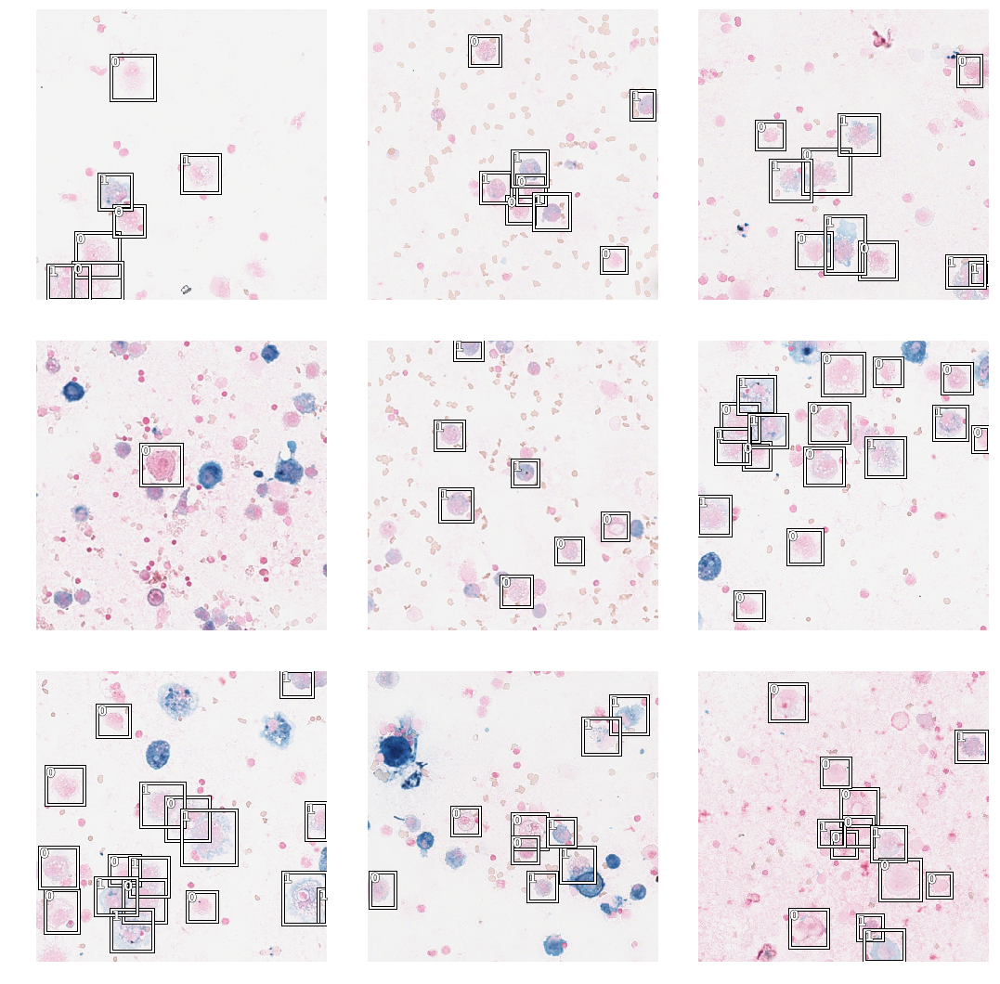

In [14]:
data.show_batch(rows=3, ds_type=DatasetType.Train, figsize=(15,15))

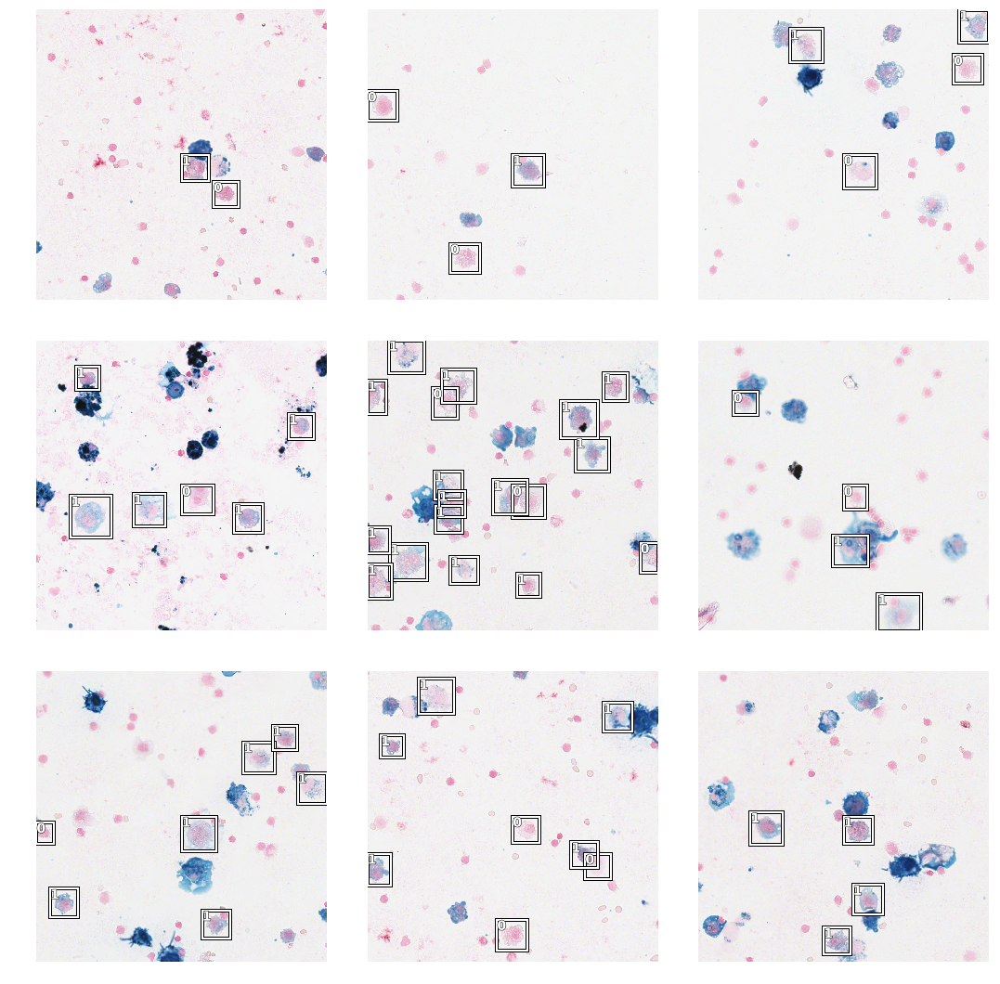

In [15]:
data.show_batch(rows=3, ds_type=DatasetType.Valid, figsize=(15,15))

In [16]:
anchors = create_anchors(sizes=[(32,32)], ratios=[1], scales=[0.6, 0.7, 0.9, 1.25, 1.5])

In [17]:
crit = RetinaNetFocalLoss(anchors)
encoder = create_body(models.resnet18, True, -2)
model = RetinaNet(encoder, n_classes=data.train_ds.c, n_anchors=5, sizes=[32], chs=128, final_bias=-4., n_conv=3)

In [18]:
voc = PascalVOCMetricByDistance(anchors, size, [str(i) for i in data.train_ds.y.classes[1:]], radius=40)
learn = Learner(data, model, loss_func=crit, callback_fns=[BBMetrics, partial(CSVLogger, append=False, filename=experiment_name)], #BBMetrics, ShowGraph
                metrics=[voc]
               )

In [19]:
learn.split([model.encoder[6], model.c5top5])
learn.freeze_to(-2)

In [20]:
learn.unfreeze()
learn.fit_one_cycle(10, 1e-3)

epoch,train_loss,valid_loss,pascal_voc_metric_by_distance,BBloss,focal_loss,AP-0,AP-1,time
0,0.478568,0.349214,0.646329,0.083766,0.265448,0.568194,0.724465,07:25
1,0.327632,0.430239,0.486621,0.085414,0.344825,0.448241,0.525001,06:43
2,0.286030,0.617228,0.505118,0.079440,0.537788,0.454361,0.555875,06:32
3,0.258866,0.515737,0.541507,0.087998,0.427739,0.403806,0.679208,07:01
4,0.234324,0.280102,0.658704,0.052352,0.227750,0.549663,0.767744,06:50
5,0.216910,0.342652,0.612215,0.055796,0.286856,0.629753,0.594676,06:40
6,0.196335,0.306349,0.710421,0.052797,0.253553,0.646409,0.774433,07:15
7,0.174427,0.223418,0.748305,0.039194,0.184224,0.692686,0.803925,06:53
8,0.161394,0.256185,0.704491,0.038371,0.217814,0.623745,0.785237,07:16
9,0.152217,0.241129,0.711314,0.036610,0.204519,0.633005,0.789624,06:52


In [21]:
import pickle

stats = {"anchors": anchors,
         "mean": to_np(data.stats[0]),
         "std": to_np(data.stats[1]),
         "size": size,
         "n_classes": 6,
         "n_anchors": 5,
         "sizes": [32],
         "chs": 128,
         "encoder": "RN-18",
         "n_conv": 3,
         "level": 0,
         "model": get_model(learn.model).state_dict()
        }

torch.save(stats, "{}.p".format(experiment_name))

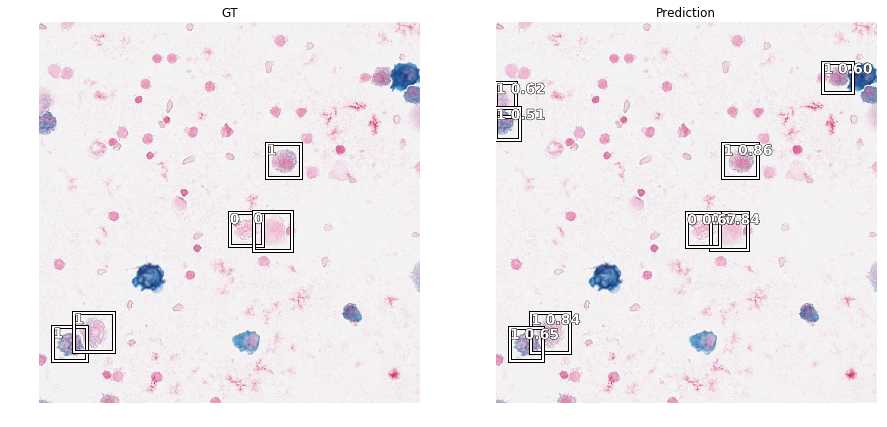

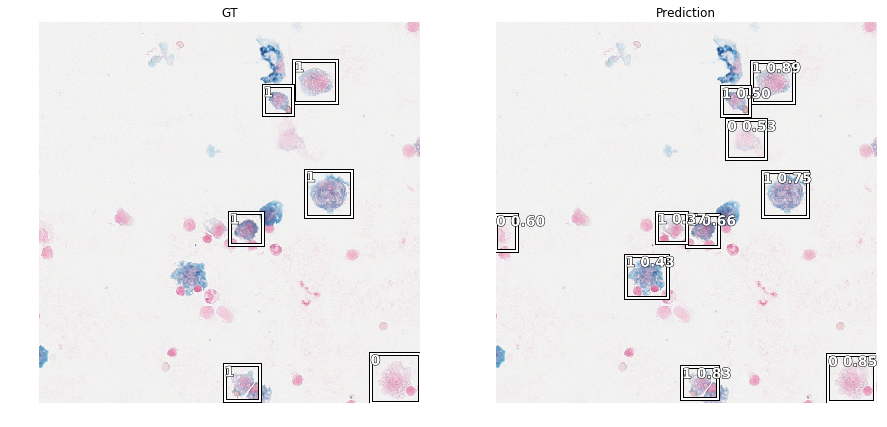

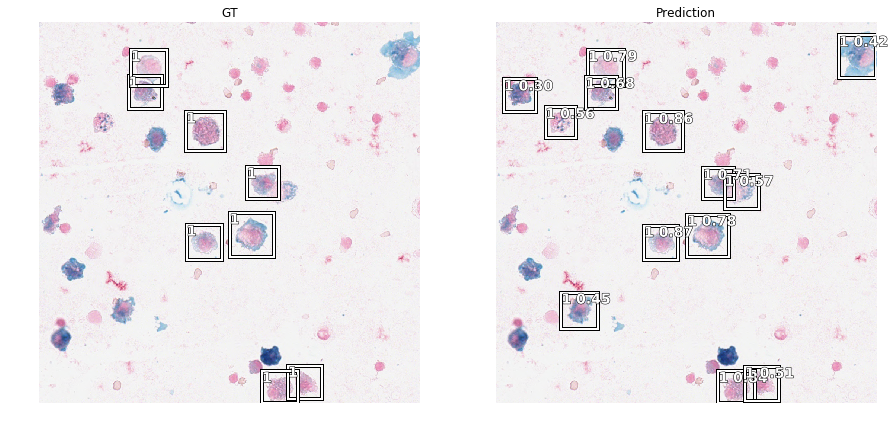

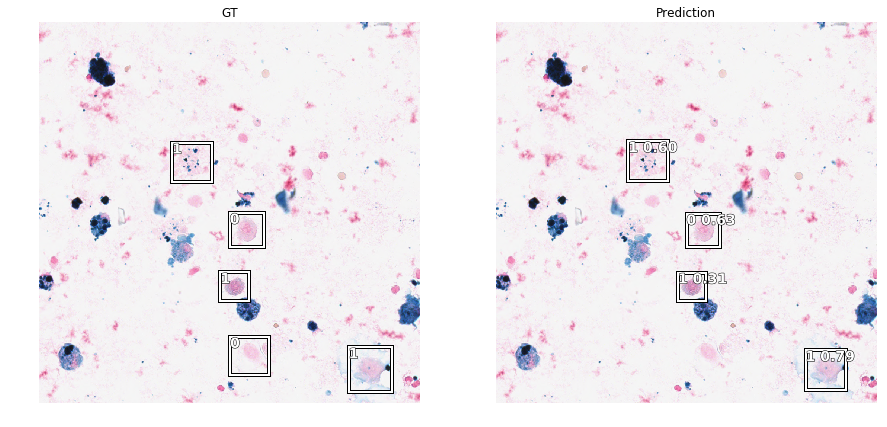

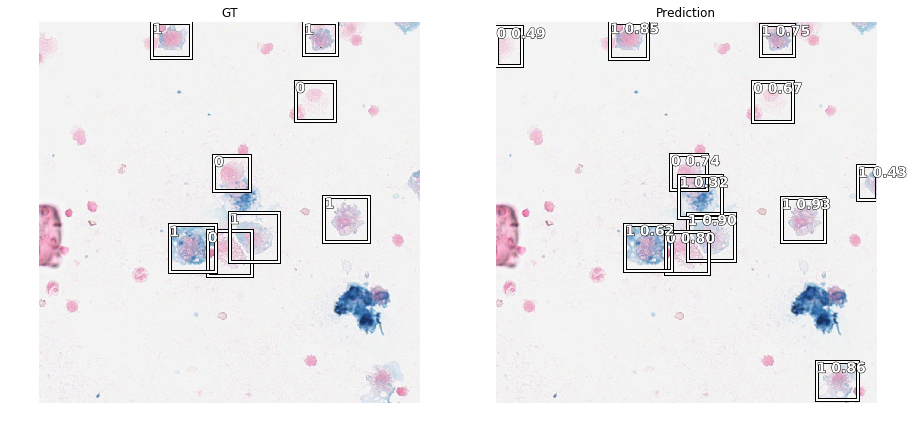

...

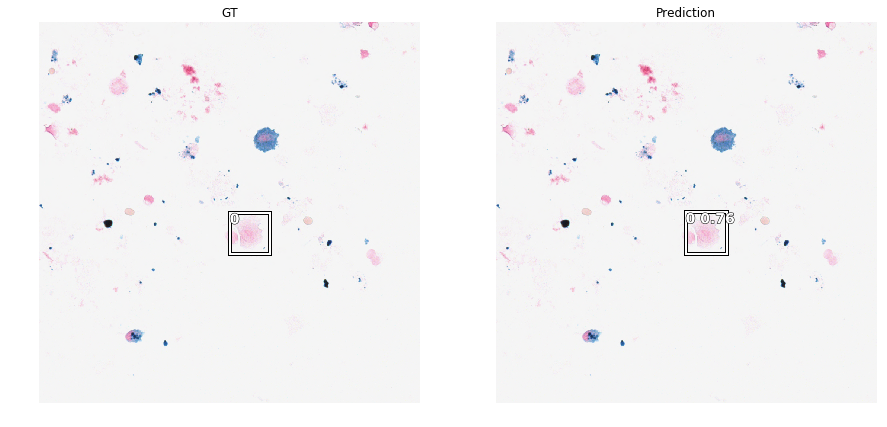

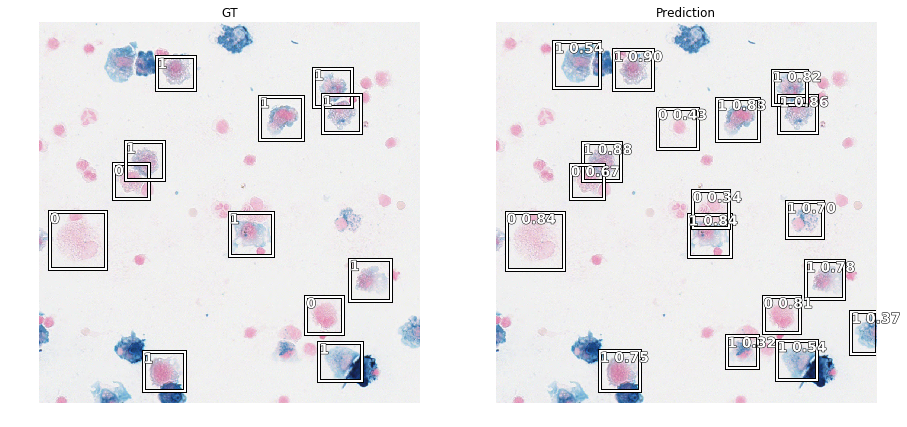

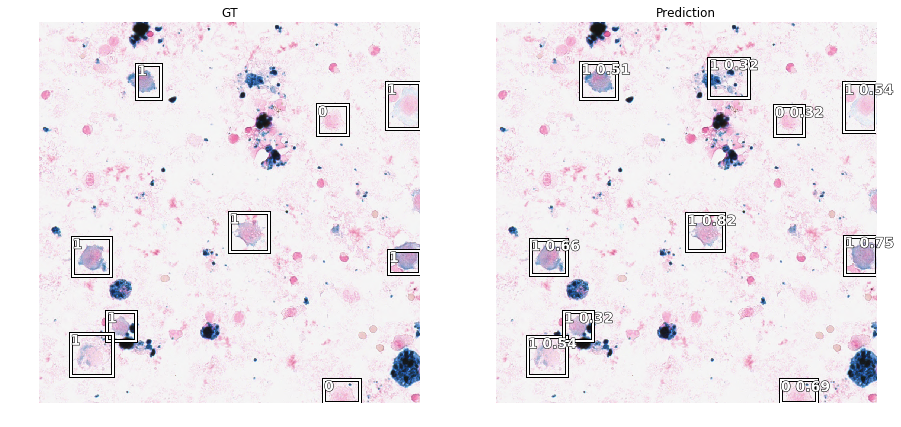

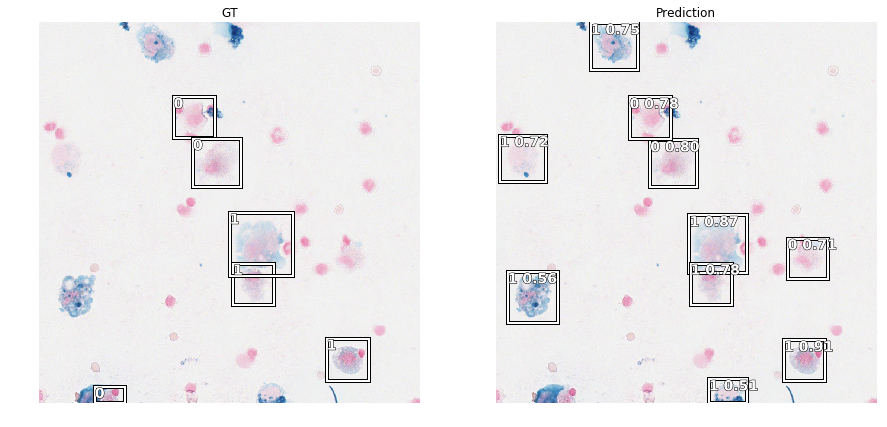

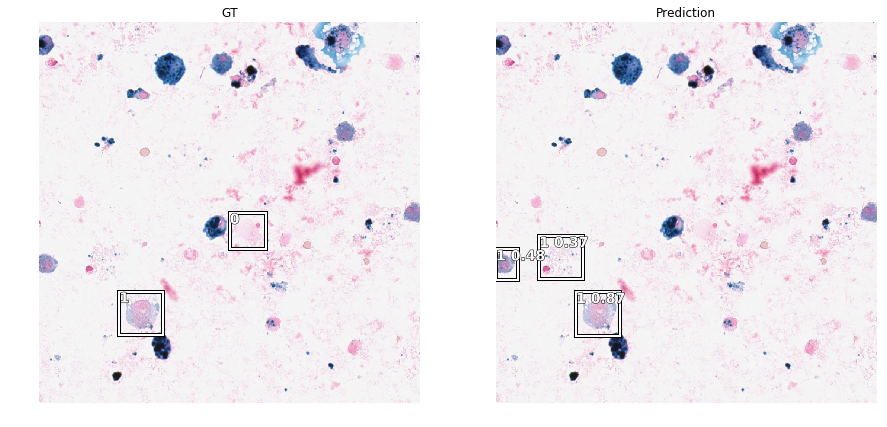

In [22]:
slide_object_result(learn, anchors, detect_thresh=0.3, nms_thresh=0.2, image_count=20)